Generate Model Metrics (Weights, R2, MSE, MAE)

Saved regional average plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_metric_plots\average_R2_AP.png


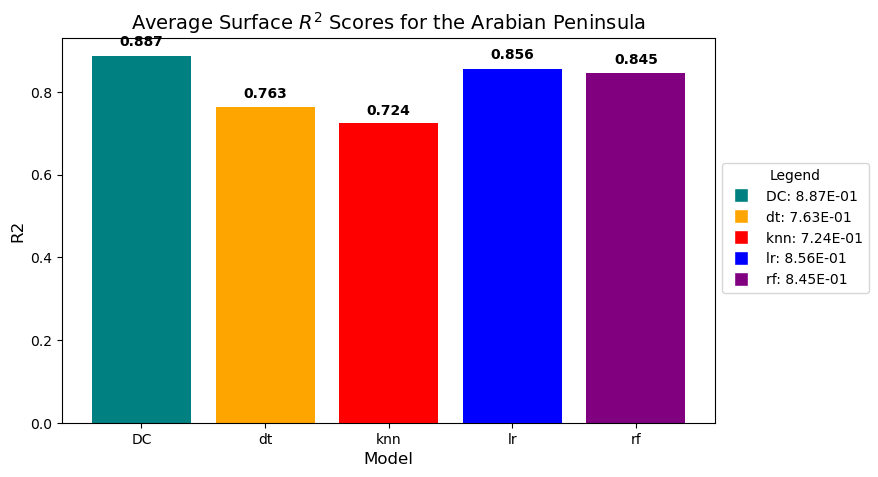

Saved regional average plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_metric_plots\average_MSE_AP.png


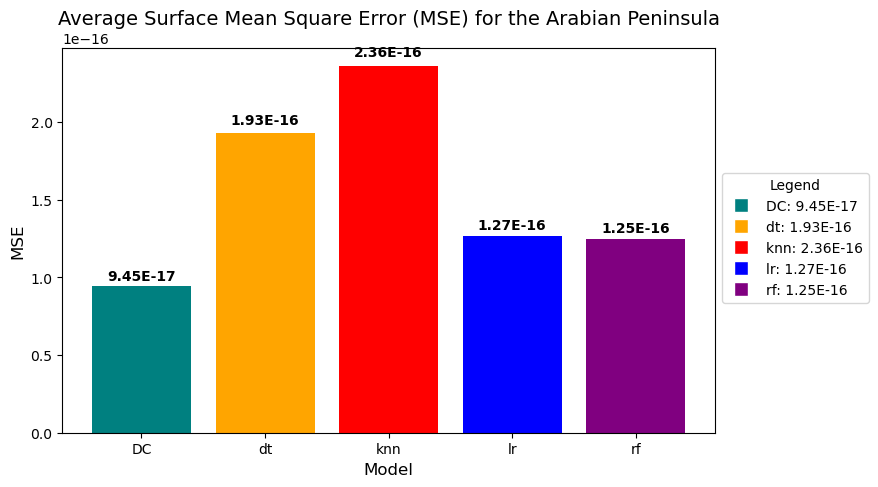

Saved regional average plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_metric_plots\average_MAE_AP.png


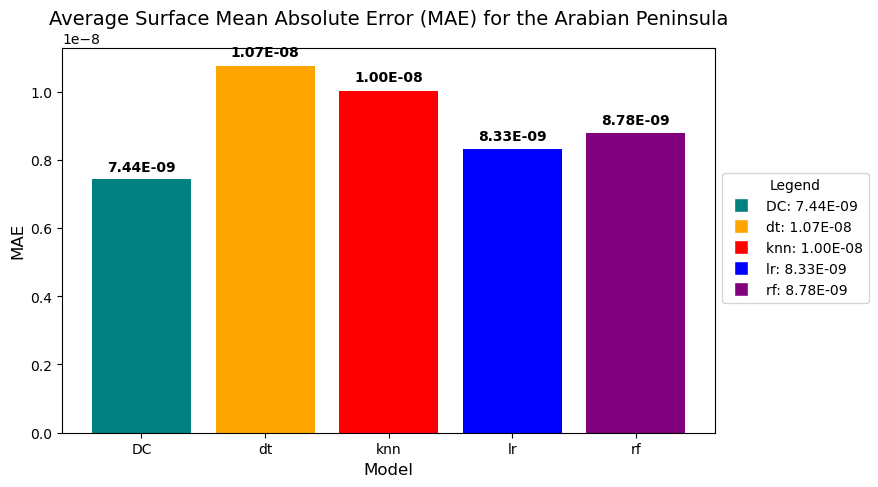

Saved regional average plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_metric_plots\average_Weight_AP.png


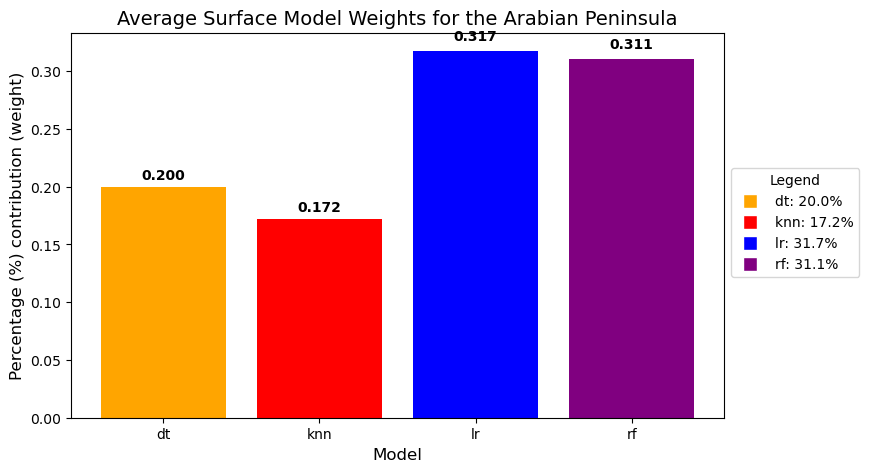

In [23]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
file_path = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\sfc_model_metrics_2023_v0063.csv"
data = pd.read_csv(file_path)

# Rename ensemble model to 'DustCast' (DC)
data['Model'] = data['Model'].replace({'ensemble': 'DC'})

# Define color and marker scheme
model_styles = {
    'DC': ('teal', 's'),  # DustCast
    'lr': ('blue', 's'),  # Linear Regression
    #'svr': ('green', 's'),  # Support Vector Regression 
    'knn': ('red', 's'),  # K-Nearest Neighbors
    'dt': ('orange', 's'),  # Decision Tree
    'rf': ('purple', 's')  # Random Forest
}

# Metrics to plot
metrics = ['Weight', 'R2', 'MSE', 'MAE']
titles = {
    'Weight': "Model Weights",
    'R2': "$R^2$ Scores",
    'MSE': "Mean Square Error (MSE)",
    'MAE': "Mean Absolute Error (MAE)"
}

# Define output directory for plots
output_dir = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_metric_plots"
os.makedirs(output_dir, exist_ok=True)  # Ensure directory exists

def add_value_labels(ax, bars, is_sci_notation=False):
    """Adds value labels on top of each bar."""
    for bar in bars:
        height = bar.get_height()
        if is_sci_notation:
            label = f"{height:.2E}"  # Scientific notation
        else:
            label = f"{height:.3f}"
        ax.text(bar.get_x() + bar.get_width() / 2, height * 1.02, label,
                ha='center', va='bottom', fontsize=10, fontweight='bold')

# Compute and plot the average MSE, MAE, R², and Weight across all countries
for metric in ['R2', 'MSE', 'MAE', 'Weight']:
    average_metrics = data.groupby('Model')[metric].mean().reset_index()
    
    # For the Weight metric, exclude DC and update the y-axis label and legend formatting
    if metric == "Weight":
        average_metrics = average_metrics[average_metrics['Model'] != 'DC']
    
    # Create a new figure for the regional average with space for the right legend
    fig, ax = plt.subplots(figsize=(9, 5))
    colors = [model_styles.get(model, ('gray', 'o'))[0] for model in average_metrics['Model']]
    
    bars = ax.bar(average_metrics['Model'], average_metrics[metric], color=colors)
    ax.set_title(f"Average Surface {titles[metric]} for the Arabian Peninsula", fontsize=14)
    ax.set_xlabel("Model", fontsize=12)
    if metric == "Weight":
        ax.set_ylabel("Percentage (%) contribution (weight)", fontsize=12)
    else:
        ax.set_ylabel(metric, fontsize=12)

    # Apply scientific notation to y-axis for small values for MSE and MAE
    if metric in ['MSE', 'MAE']:
        ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
        add_value_labels(ax, bars, is_sci_notation=True)
    else:
        add_value_labels(ax, bars, is_sci_notation=False)

    # Separate Legends: Model Colors (inside) and Metric Values (right outside)
    filtered_models = average_metrics['Model'].unique()

    # Legend 1: Model Colors (inside graph, upper right)
    handles_colors = [plt.Line2D([0], [0], marker=model_styles[m][1], color='w', 
                                 markerfacecolor=model_styles[m][0], markersize=10) 
                      for m in filtered_models if m in model_styles]

    # Legend 2: Metric Values (right next to the graph)
    if metric == "Weight":
        # Convert the average weight value to a percentage (multiply by 100) and format accordingly.
        labels_values = [f"{m}: {average_metrics[average_metrics['Model'] == m][metric].values[0]*100:.1f}%" 
                         for m in filtered_models if m in model_styles]
    else:
        labels_values = [f"{m}: {average_metrics[average_metrics['Model'] == m][metric].values[0]:.2E}"
                         for m in filtered_models if m in model_styles]
    
    fig.subplots_adjust(right=0.85)  # Adjust spacing for the second legend
    legend2 = plt.figlegend(handles_colors, labels_values, loc='center left', title="Legend", bbox_to_anchor=(0.85, 0.5))

    # Save the figure
    save_path = os.path.join(output_dir, f"average_{metric}_AP.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Saved regional average plot: {save_path}")

    # Show the plot
    plt.show()


Generate Feature Importances for RF and DT

Saved feature importance plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\feature_importance_plots\feature_importance_Bahrain.png


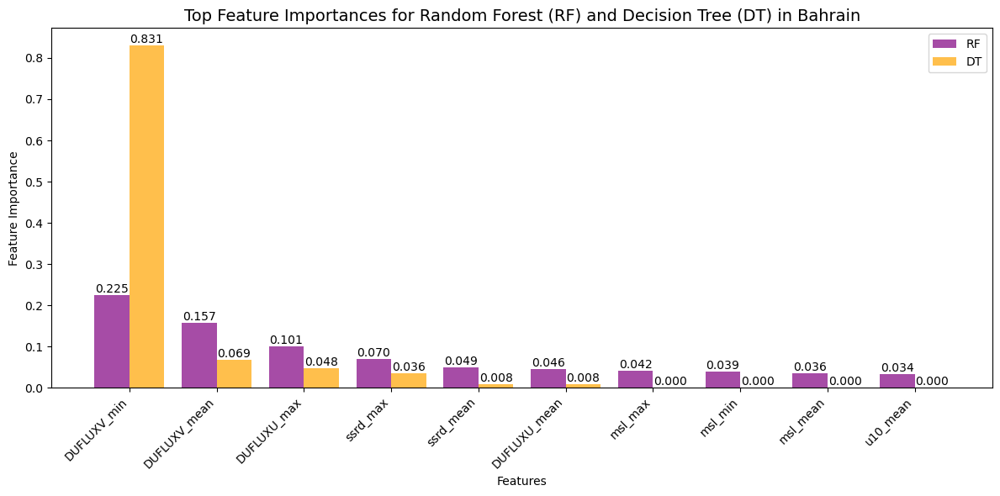

Saved feature importance plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\feature_importance_plots\feature_importance_Yemen.png


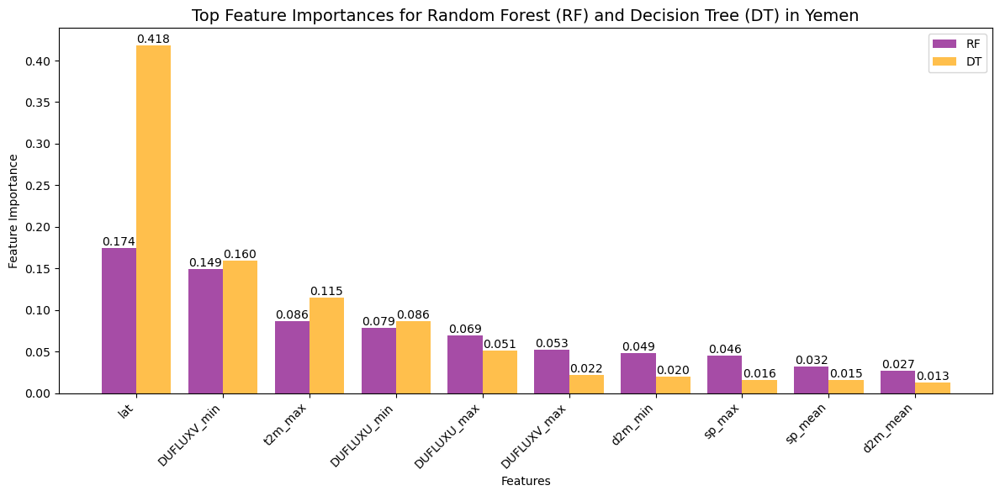

Saved feature importance plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\feature_importance_plots\feature_importance_Kuwait.png


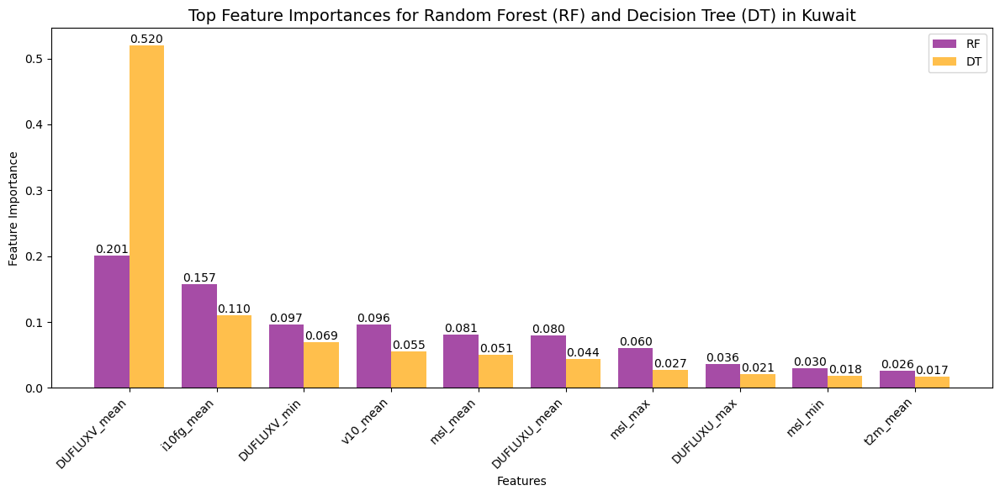

Saved feature importance plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\feature_importance_plots\feature_importance_Oman.png


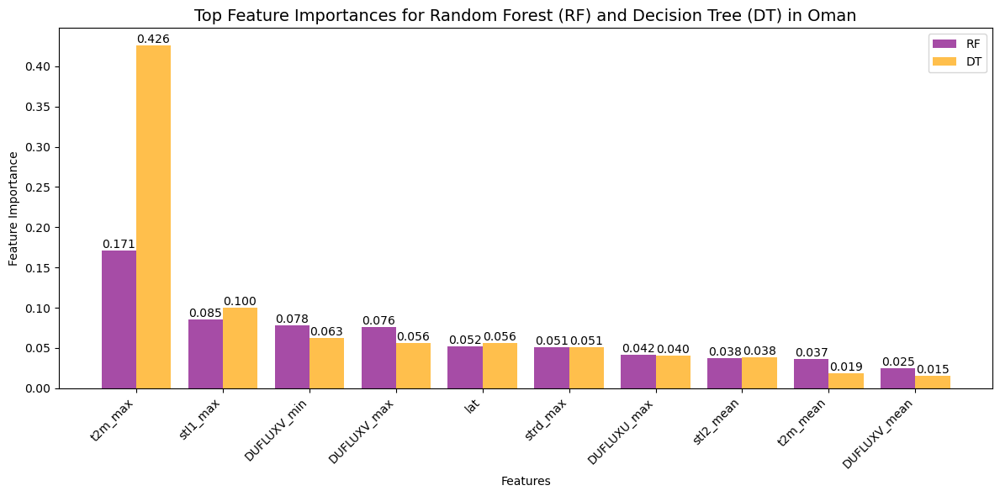

Saved feature importance plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\feature_importance_plots\feature_importance_Qatar.png


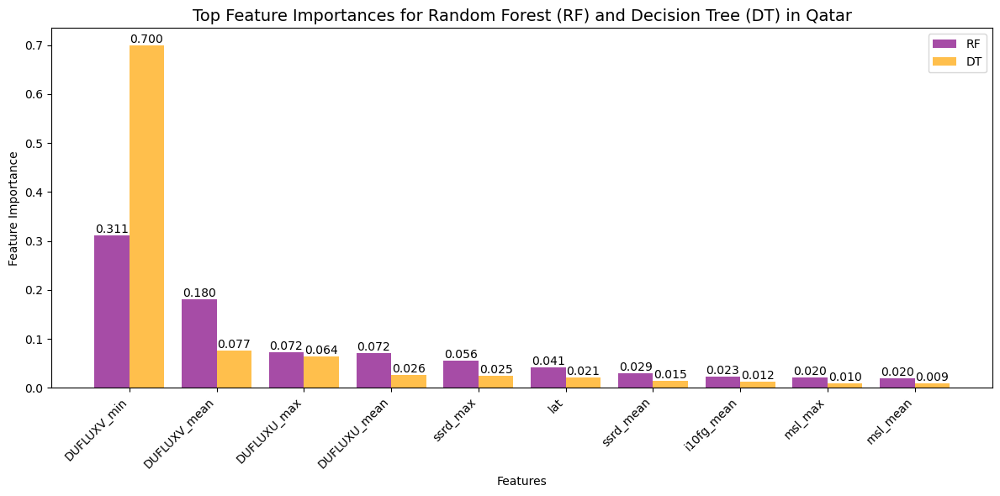

Saved feature importance plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\feature_importance_plots\feature_importance_Saudi_Arabia.png


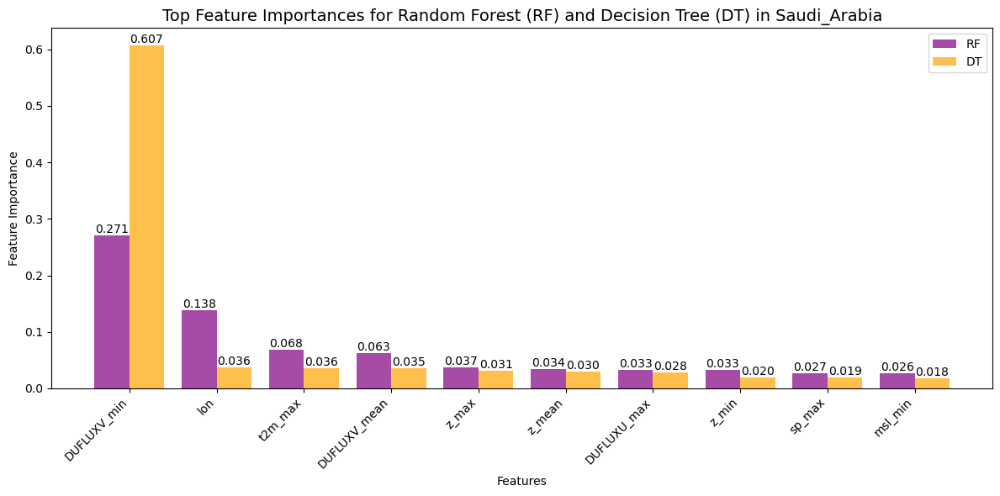

Saved feature importance plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\feature_importance_plots\feature_importance_United_Arab_Emirates.png


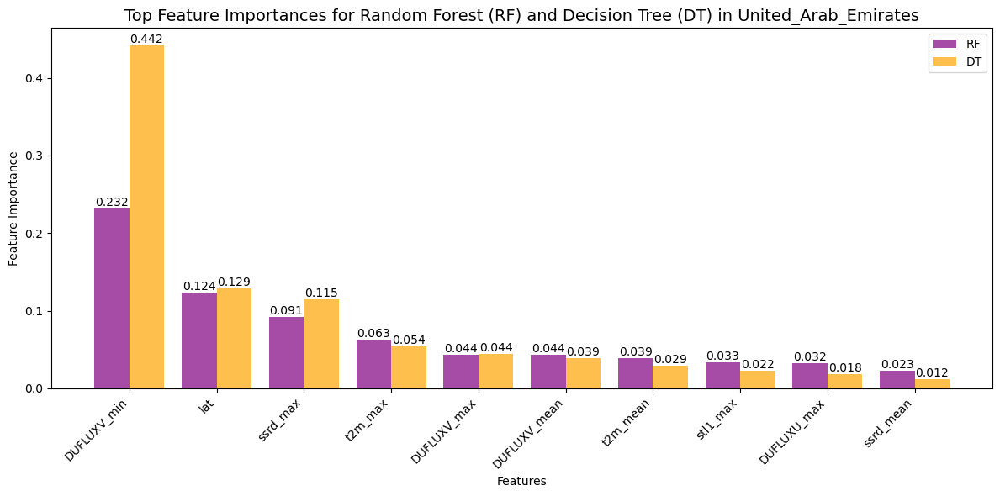

Saved regional feature importance plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\feature_importance_plots\feature_importance_AP.png


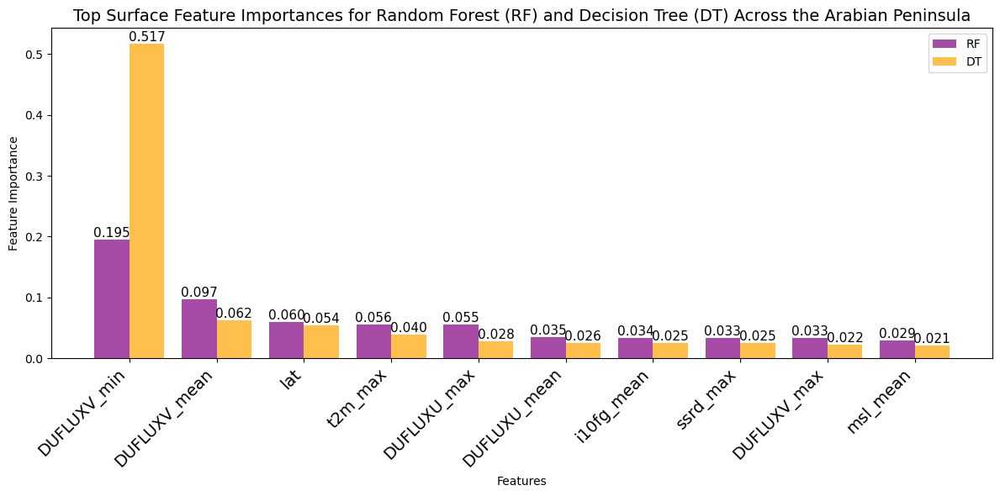

In [4]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
file_path = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\sfc_feature_importances_2023_v0063.csv"
feature_importances_data = pd.read_csv(file_path)

# Define output directory for feature importance plots
output_dir = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\feature_importance_plots"
os.makedirs(output_dir, exist_ok=True)  # Ensure directory exists

# Get unique countries
countries = feature_importances_data['Country'].unique()

# Loop through each country to generate feature importance plots
for country in countries:
    country_data = feature_importances_data[feature_importances_data['Country'] == country]

    # Select top features for RF and DT
    top_features_rf = country_data[['Feature', 'rf']].sort_values(by='rf', ascending=False).head(10)
    top_features_dt = country_data[['Feature', 'dt']].sort_values(by='dt', ascending=False).head(10)

    bar_width = 0.4
    indices = np.arange(len(top_features_rf))

    fig, ax = plt.subplots(figsize=(12, 6))
    bars_rf = ax.bar(indices - bar_width / 2, top_features_rf['rf'], bar_width, label='RF', color='purple', alpha=0.7)
    bars_dt = ax.bar(indices + bar_width / 2, top_features_dt['dt'], bar_width, label='DT', color='orange', alpha=0.7)

    ax.set_title(f'Top Feature Importances for Random Forest (RF) and Decision Tree (DT) in {country}', fontsize=14)
    ax.set_ylabel('Feature Importance')
    ax.set_xlabel('Features')
    ax.set_xticks(indices)
    ax.set_xticklabels(top_features_rf['Feature'], rotation=45, ha='right')
    ax.legend()

    # Add text labels on bars
    for bar in bars_rf:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.3f}', ha='center', va='bottom', fontsize=10)

    for bar in bars_dt:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.3f}', ha='center', va='bottom', fontsize=10)

    fig.tight_layout()

    # Save the plot
    save_path = os.path.join(output_dir, f"feature_importance_{country}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Saved feature importance plot: {save_path}")

    plt.show()

# **Compute and plot the average feature importance across the Arabian Peninsula**
average_feature_importance = feature_importances_data.groupby("Feature")[["rf", "dt"]].mean().reset_index()

# Select top features for RF and DT based on the Arabian Peninsula average
top_features_rf_ap = average_feature_importance[['Feature', 'rf']].sort_values(by='rf', ascending=False).head(10)
top_features_dt_ap = average_feature_importance[['Feature', 'dt']].sort_values(by='dt', ascending=False).head(10)

bar_width = 0.4
indices = np.arange(len(top_features_rf_ap))

fig, ax = plt.subplots(figsize=(12, 6))
bars_rf = ax.bar(indices - bar_width / 2, top_features_rf_ap['rf'], bar_width, label='RF', color='purple', alpha=0.7)
bars_dt = ax.bar(indices + bar_width / 2, top_features_dt_ap['dt'], bar_width, label='DT', color='orange', alpha=0.7)

ax.set_title('Top Surface Feature Importances for Random Forest (RF) and Decision Tree (DT) Across the Arabian Peninsula', fontsize=14)
ax.set_ylabel('Feature Importance')
ax.set_xlabel('Features')
ax.set_xticks(indices)
ax.set_xticklabels(top_features_rf_ap['Feature'], rotation=45, ha='right', fontsize=14)
ax.legend()

# Add text labels on bars
for bar in bars_rf:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.3f}', ha='center', va='bottom', fontsize=11)

for bar in bars_dt:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.3f}', ha='center', va='bottom', fontsize=11)

fig.tight_layout()

# Save the plot
save_path = os.path.join(output_dir, "feature_importance_AP.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')
print(f"Saved regional feature importance plot: {save_path}")

plt.show()


In [13]:
# Pearsons R for the row level predictions
import pandas as pd
import numpy as np

# Load the dataset
file_path = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\sfc_row_level_predictions_2023_v0063.csv"
data = pd.read_csv(file_path)

# Drop non-numeric columns
numeric_data = data.select_dtypes(include=[np.number])

# Compute Pearson correlation matrix
cor_matrix = numeric_data.corr(method='pearson')

# Save to CSV
output_path = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\Pearsons_R.csv"
cor_matrix.to_csv(output_path, index=True)

print(f"Pearson correlation matrix saved to {output_path}")

Pearson correlation matrix saved to Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\Pearsons_R.csv


Generate Pearsons R heatmap

Saved Pearson correlation heatmap: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\correlation_plots\pearson_heatmap.png


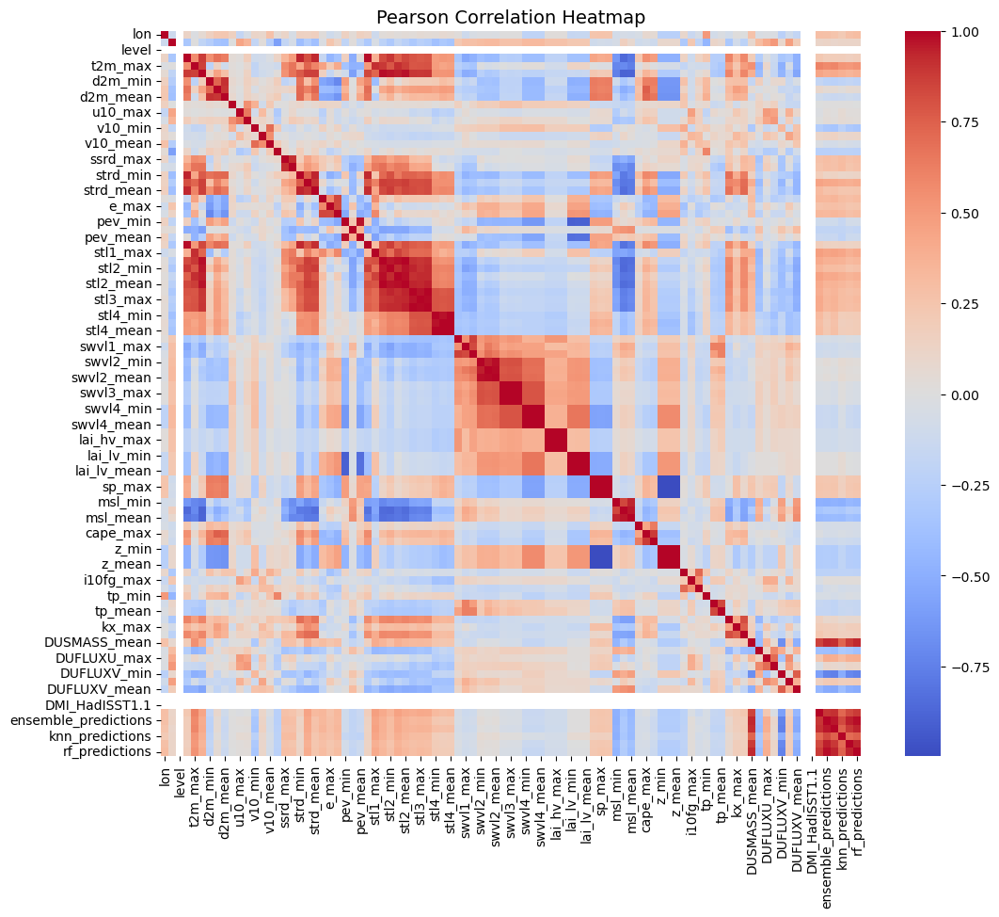

High correlation pairs saved to Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\correlation_plots\high_correlation_features.csv


In [14]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Pearson correlation matrix from CSV
file_path = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\Pearsons_R.csv"
cor_matrix = pd.read_csv(file_path, index_col=0)

# Define output directory for correlation plots
output_dir = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\correlation_plots"
os.makedirs(output_dir, exist_ok=True)  # Ensure directory exists

# Plot heatmap without annotations
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(cor_matrix, annot=False, cbar=True, cmap="coolwarm", ax=ax)
ax.set_title('Pearson Correlation Heatmap', fontsize=14)

# Save the heatmap
heatmap_save_path = os.path.join(output_dir, "pearson_heatmap.png")
plt.savefig(heatmap_save_path, dpi=300, bbox_inches='tight')
print(f"Saved Pearson correlation heatmap: {heatmap_save_path}")

plt.show()

# Extract correlation pairs greater than 0.75 and exclude values of 1.00
high_corr = cor_matrix.unstack().reset_index()
high_corr.columns = ['Feature1', 'Feature2', 'Correlation']
high_corr = high_corr[(high_corr['Feature1'] != high_corr['Feature2']) & (high_corr['Correlation'] < 1.00)]  # Remove self-correlations and 1.00 values
high_corr = high_corr[high_corr['Correlation'] > 0.75].drop_duplicates().sort_values(by='Correlation', ascending=False)

# Function to check if variable names match base name but end with _mean, _max, _min
def exclude_similar_variables(df):
    to_exclude = set()
    for index, row in df.iterrows():
        base1, suffix1 = row['Feature1'].rsplit('_', 1) if '_' in row['Feature1'] else (row['Feature1'], '')
        base2, suffix2 = row['Feature2'].rsplit('_', 1) if '_' in row['Feature2'] else (row['Feature2'], '')
        if base1 == base2 and suffix1 in {'mean', 'max', 'min'} and suffix2 in {'mean', 'max', 'min'}:
            to_exclude.add(index)
    return df.drop(to_exclude)

# Apply exclusion filter
high_corr = exclude_similar_variables(high_corr)

# Save high correlation values to CSV
output_csv_path = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\correlation_plots\high_correlation_features.csv"
high_corr.to_csv(output_csv_path, index=False)

print(f"High correlation pairs saved to {output_csv_path}")

Generate Country row mapping

In [15]:
import pandas as pd

# Load the dataset
file_path = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\sfc_row_level_predictions_2023_v0063.csv"
data = pd.read_csv(file_path)

# Ensure 'Country' column exists
if 'Country' not in data.columns:
    raise KeyError("The dataset does not contain the required column: 'Country'.")

# Compute index ranges for each country
country_ranges = {}
for country in data['Country'].unique():
    country_indices = data[data['Country'] == country].index
    country_ranges[country] = (country_indices.min() + 1, country_indices.max() + 1)  # +1 to make it 1-based indexing

# Display results
for country, (start, end) in country_ranges.items():
    print(f"{country}: {start} - {end}")


Bahrain: 1 - 36
Yemen: 37 - 17124
Kuwait: 17125 - 17796
Oman: 17797 - 33156
Qatar: 33157 - 33492
Saudi_Arabia: 33493 - 99792
United_Arab_Emirates: 99793 - 103152


produce Baseline MERRA-2 AOD Graph

Saved DUSMASS mean plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\dusmass_plots\duSmass_mean_plot.png


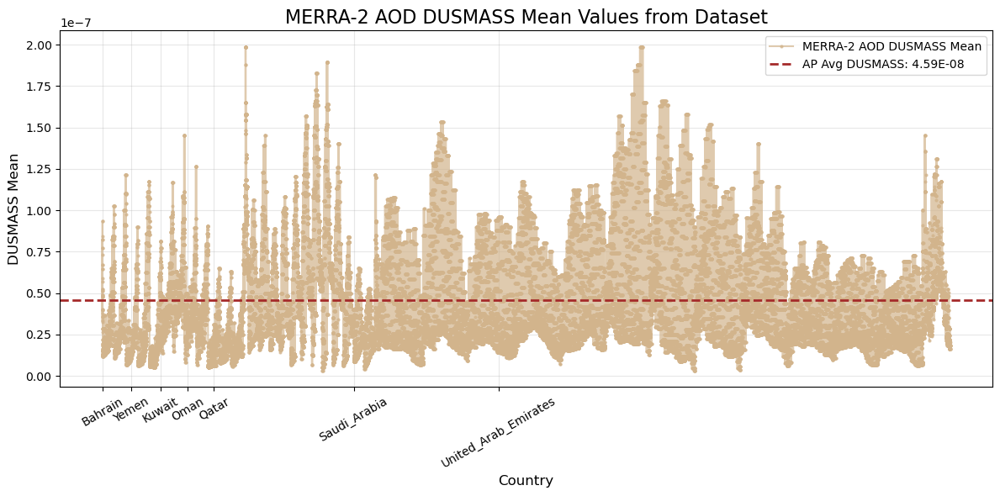

In [16]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define the file path for the dataset
file_path = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\sfc_row_level_predictions_2023_v0063.csv"

# Define output directory for DUSMASS plots
output_dir = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\dusmass_plots"
os.makedirs(output_dir, exist_ok=True)  # Ensure directory exists

# Updated country index ranges
country_ranges = {
    "Bahrain": (1, 24),
    "Yemen": (25, 6912),
    "Kuwait": (6913, 7284),
    "Oman": (7285, 13476),
    "Qatar": (13477, 13632),
    "Saudi_Arabia": (13633, 47532),
    "United_Arab_Emirates": (47533, 48996)
}

# Define the average DUSMASS concentration for the AP
average_dusmass = 4.59E-08


# Load the dataset
try:
    dataset = pd.read_csv(file_path)

    # Extract the column 'DUSMASS_mean'
    dusmass_mean = dataset['DUSMASS_mean']

    # Create the figure and plot
    plt.figure(figsize=(12, 6))
    plt.plot(dusmass_mean, linestyle='-', marker='o', markersize=2, color='tan', alpha=0.7, label='MERRA-2 AOD DUSMASS Mean')

    # Add a horizontal line for the average DUSMASS concentration
    plt.axhline(y=average_dusmass, color='brown', linestyle='--', linewidth=2, label=f'AP Avg DUSMASS: {average_dusmass:.2E}')

    # Set x-axis labels by country
    xticks = []
    xticklabels = []
    for country, (start, end) in country_ranges.items():
        mid_index = (start + end) // 2
        xticks.append(mid_index)
        xticklabels.append(country)

    plt.xticks(xticks, xticklabels, rotation=30, fontsize=10)

    # Formatting
    plt.title('MERRA-2 AOD DUSMASS Mean Values from Dataset', fontsize=16)
    plt.xlabel('Country', fontsize=12)
    plt.ylabel('DUSMASS Mean', fontsize=12)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()

    # Save the plot
    save_path = os.path.join(output_dir, "duSmass_mean_plot.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Saved DUSMASS mean plot: {save_path}")

    # Show the plot
    plt.show()

except FileNotFoundError:
    print("The file was not found. Please ensure the file path is correct.")
except KeyError:
    print("'DUSMASS_mean' column not found in the dataset.")
except Exception as e:
    print(f"An error occurred: {e}")


In [ ]:
Graph of Model performances for AP

Saved model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_prediction_plots\ensemble_predictions_predictions.png


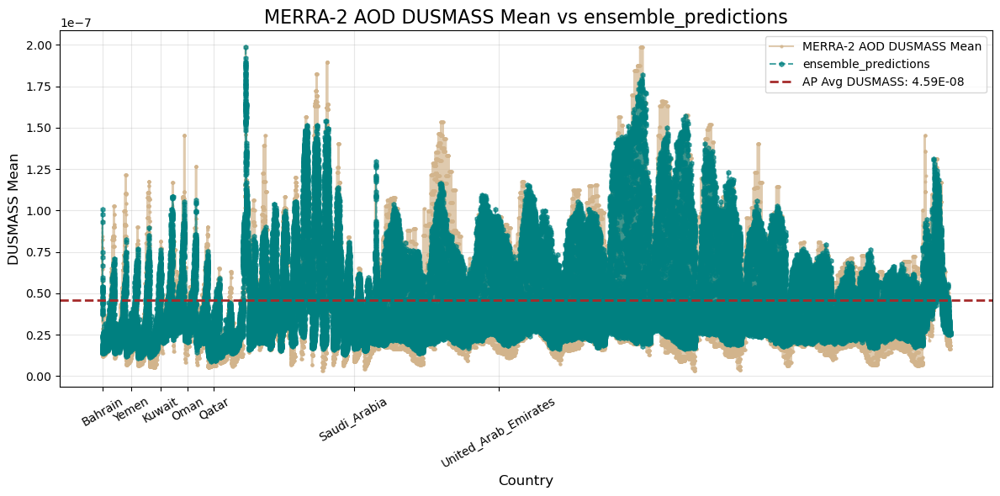

Saved model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_prediction_plots\lr_predictions_predictions.png


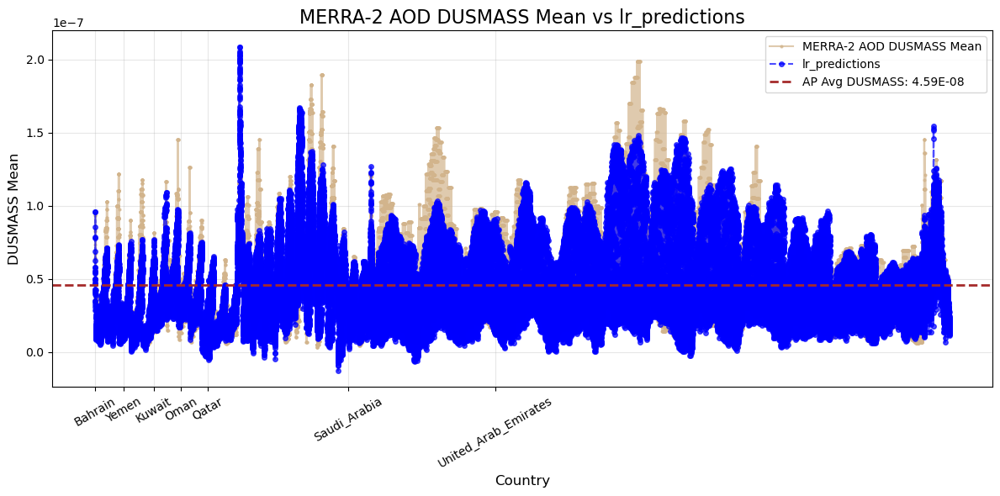

Saved model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_prediction_plots\knn_predictions_predictions.png


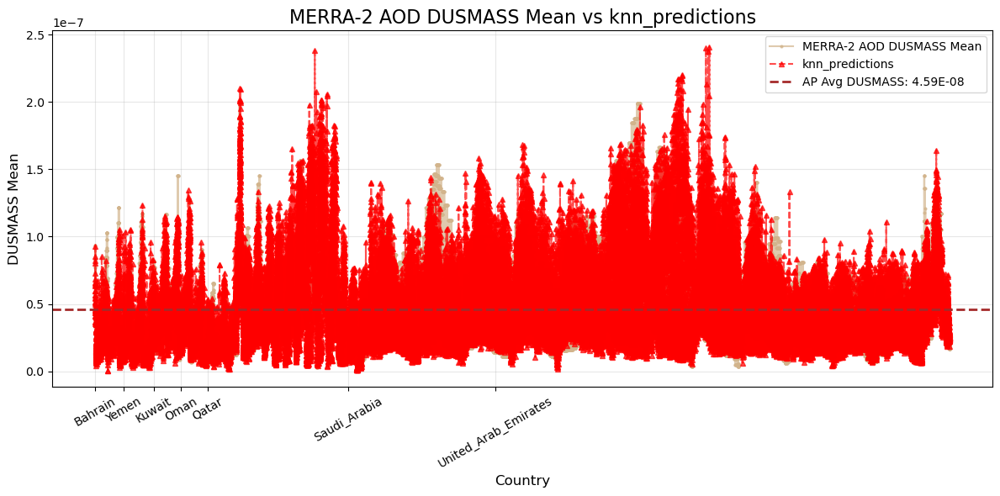

Saved model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_prediction_plots\dt_predictions_predictions.png


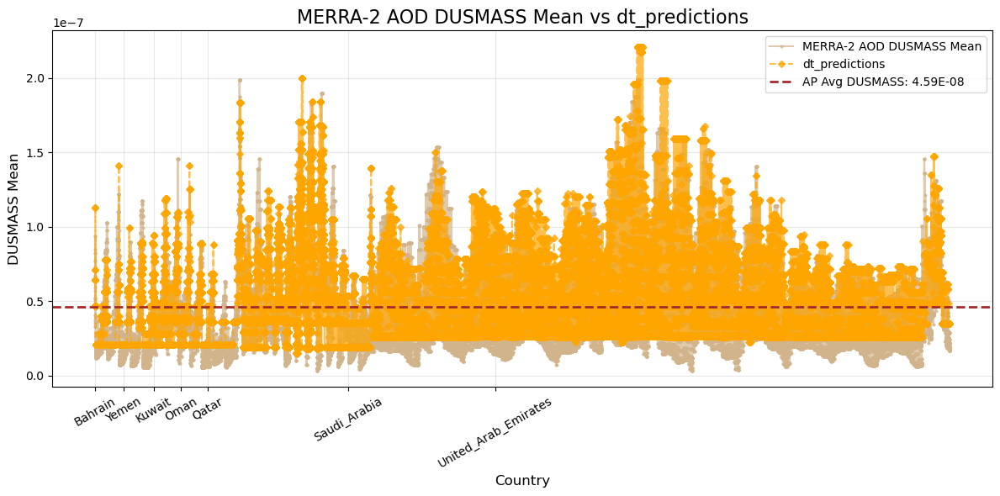

Saved model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_prediction_plots\rf_predictions_predictions.png


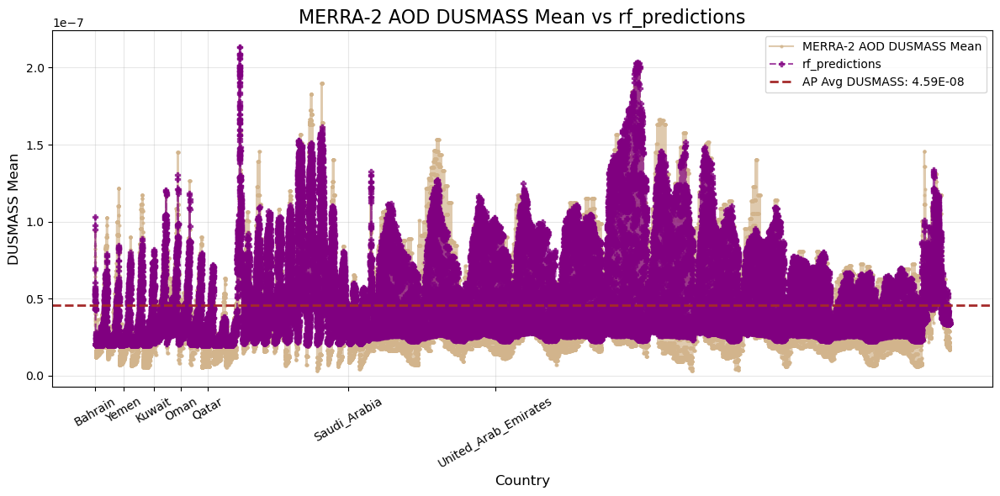

In [17]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define the file path for the dataset
file_path = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\sfc_row_level_predictions_2023_v0063.csv"

# Define output directory for model prediction plots
output_dir = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\model_prediction_plots"
os.makedirs(output_dir, exist_ok=True)  # Ensure directory exists

# Define model styles
model_styles = {
    'ensemble_predictions': ('teal', 'h'),  # DustCast (DC)
    'lr_predictions': ('blue', 'o'),  # Linear Regression
    #'svr_predictions': ('green', 's'),  # Support Vector Regression
    'knn_predictions': ('red', '^'),  # K-Nearest Neighbors
    'dt_predictions': ('orange', 'D'),  # Decision Tree
    'rf_predictions': ('purple', 'P')  # Random Forest
}

# Updated country index ranges
country_ranges = {
    "Bahrain": (1, 24),
    "Yemen": (25, 6912),
    "Kuwait": (6913, 7284),
    "Oman": (7285, 13476),
    "Qatar": (13477, 13632),
    "Saudi_Arabia": (13633, 47532),
    "United_Arab_Emirates": (47533, 48996),
}

# Define the AP average DUSMASS concentration
average_dusmass = 4.59E-08

# Load the dataset
try:
    dataset = pd.read_csv(file_path)

    # Extract the required columns
    dusmass_mean = dataset['DUSMASS_mean']
    models = model_styles.keys()

    # Loop through each model and create a separate plot
    for model in models:
        # Extract predictions for the current model
        predictions = dataset[model]
        color, marker = model_styles[model]
        
        # Create the plot
        plt.figure(figsize=(12, 6))
        plt.plot(dusmass_mean, linestyle='-', marker='o', markersize=2, color='tan', alpha=0.7, label='MERRA-2 AOD DUSMASS Mean')
        plt.plot(predictions, linestyle='--', marker=marker, markersize=4, color=color, alpha=0.7, label=f'{model}')
        
        # Add horizontal line for AP Avg DUSMASS
        plt.axhline(y=average_dusmass, color='brown', linestyle='--', linewidth=2, label=f'AP Avg DUSMASS: {average_dusmass:.2E}')

        # Set x-axis labels by country
        xticks = []
        xticklabels = []
        for country, (start, end) in country_ranges.items():
            mid_index = (start + end) // 2
            xticks.append(mid_index)
            xticklabels.append(country)

        plt.xticks(xticks, xticklabels, rotation=30, fontsize=10)

        # Formatting
        plt.title(f'MERRA-2 AOD DUSMASS Mean vs {model}', fontsize=16)
        plt.xlabel('Country', fontsize=12)
        plt.ylabel('DUSMASS Mean', fontsize=12)
        plt.legend()
        plt.grid(alpha=0.3)
        plt.tight_layout()

        # Save the plot
        save_path = os.path.join(output_dir, f"{model}_predictions.png")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved model prediction plot: {save_path}")

        # Show the plot
        plt.show()

except FileNotFoundError:
    print("The file was not found. Please ensure the file path is correct.")
except KeyError as e:
    print(f"Column not found in the dataset: {e}")
except Exception as e:
    print(f"An error occurred: {e}")


Graph of country Level performances

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Bahrain_ensemble_predictions_predictions.png


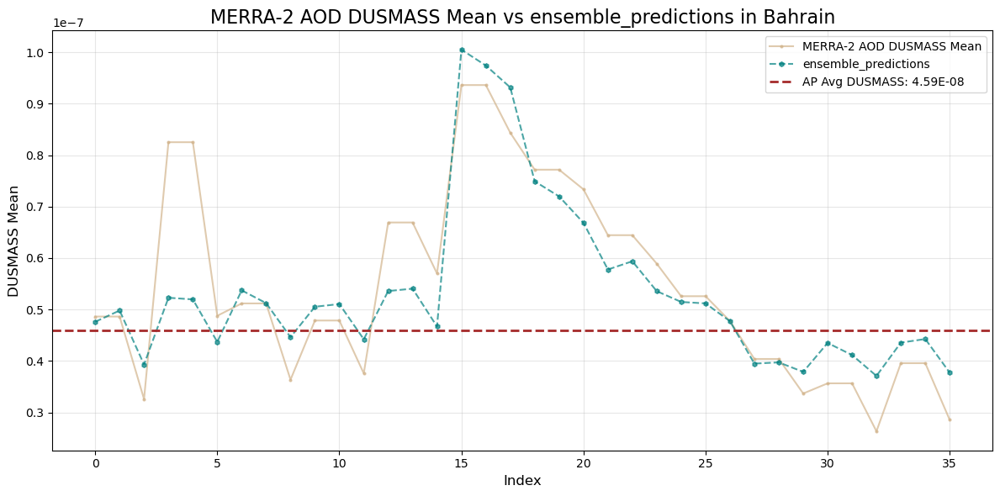

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Bahrain_lr_predictions_predictions.png


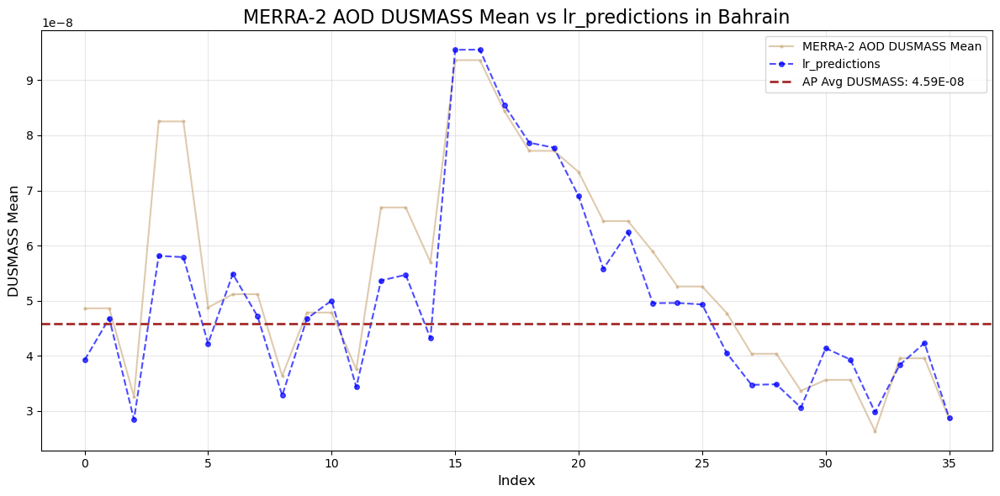

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Bahrain_knn_predictions_predictions.png


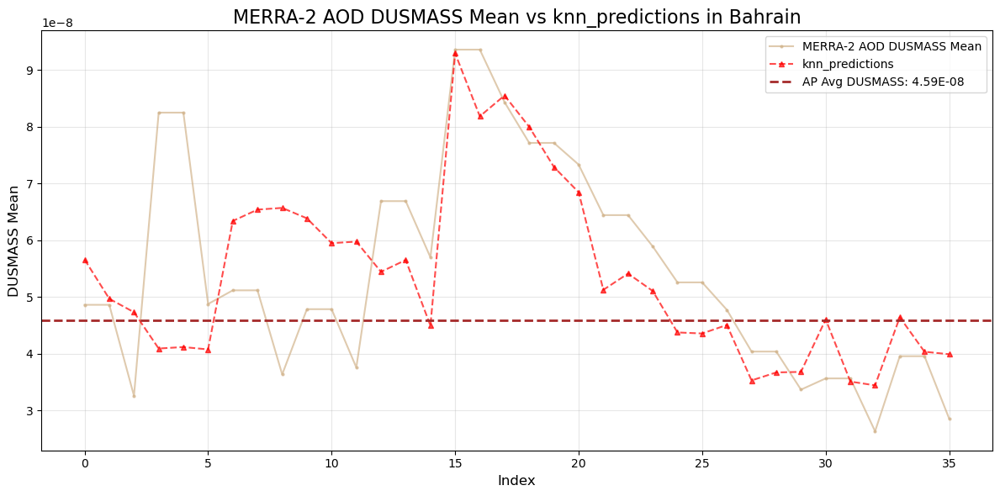

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Bahrain_dt_predictions_predictions.png


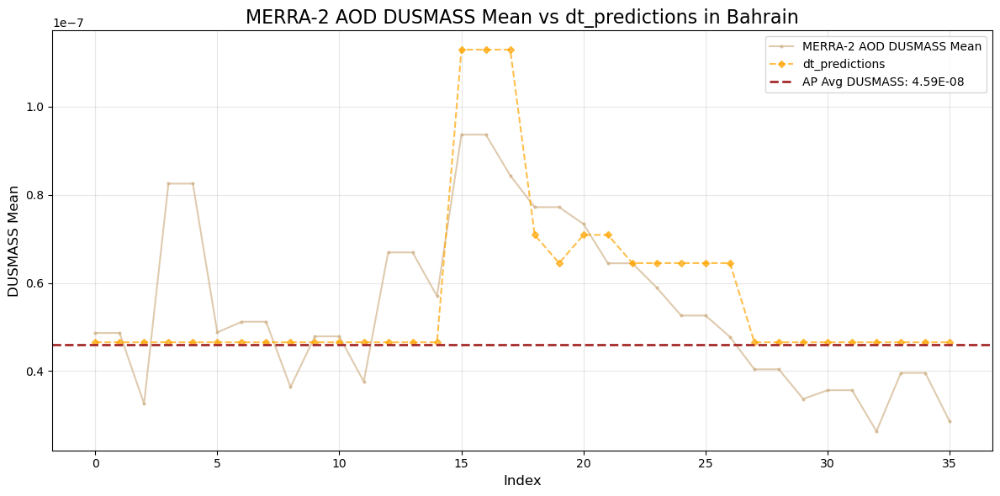

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Bahrain_rf_predictions_predictions.png


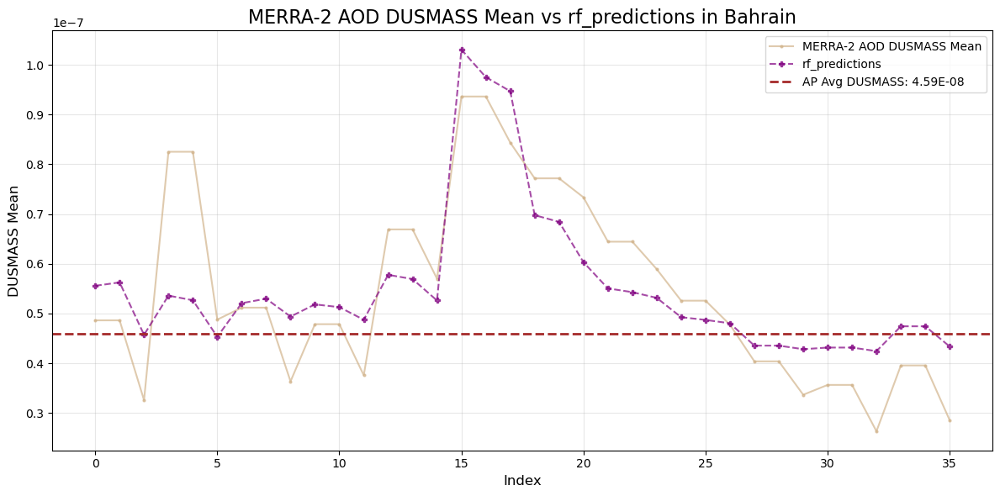

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Yemen_ensemble_predictions_predictions.png


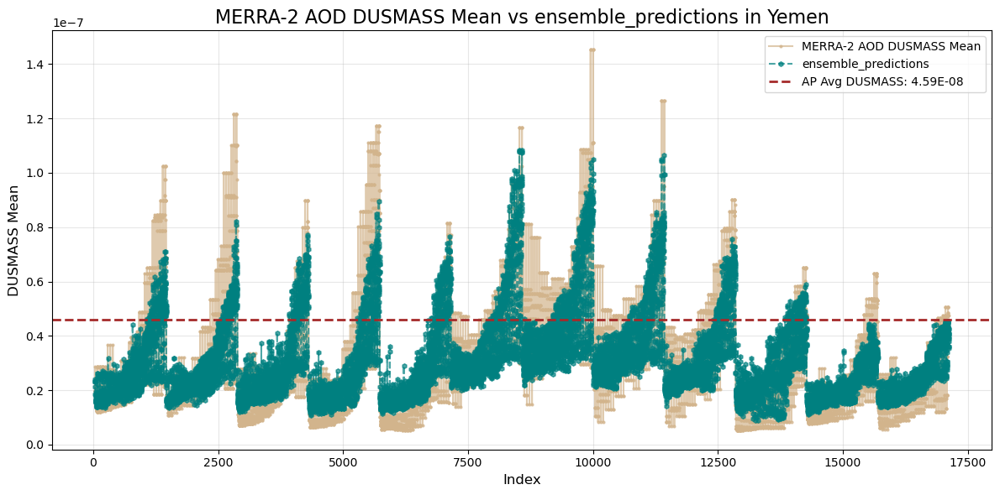

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Yemen_lr_predictions_predictions.png


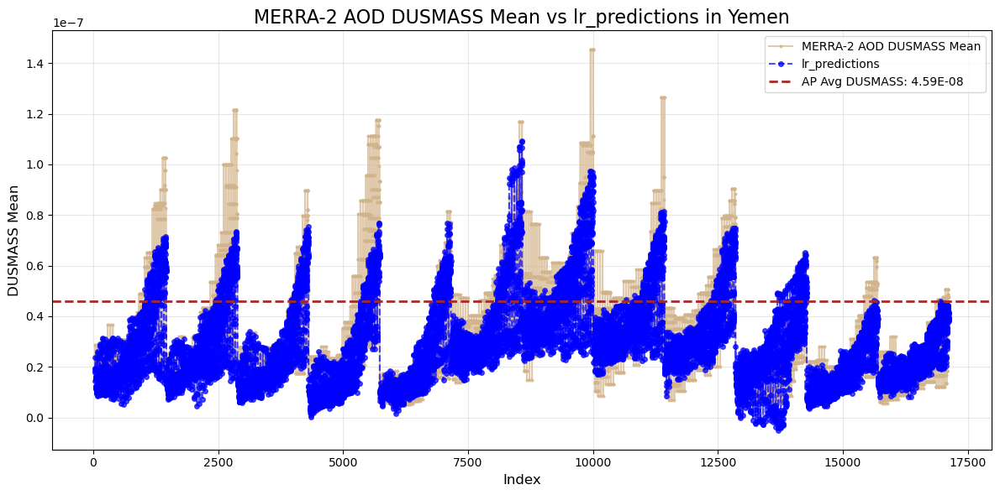

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Yemen_knn_predictions_predictions.png


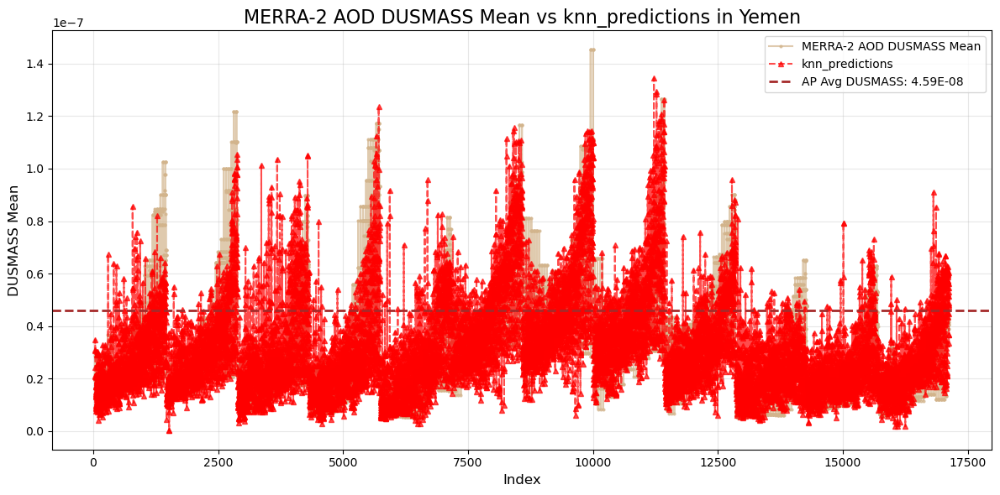

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Yemen_dt_predictions_predictions.png


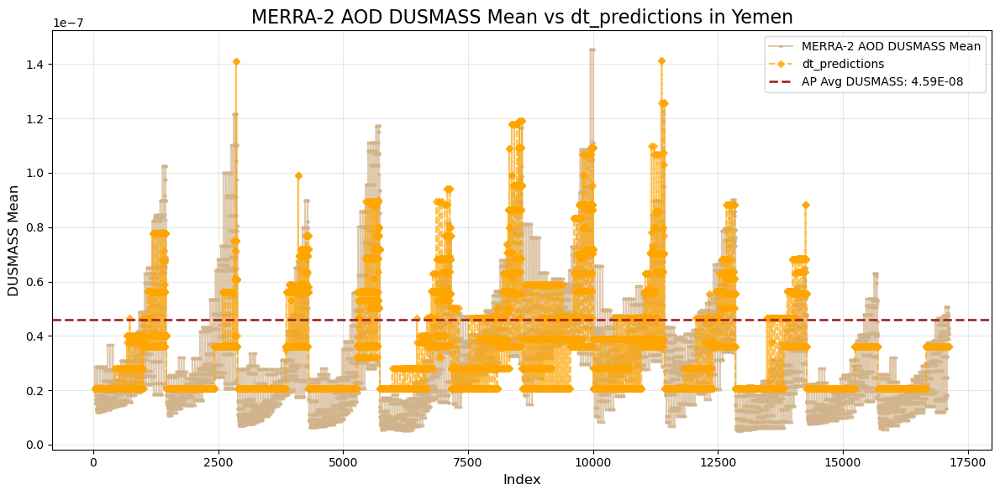

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Yemen_rf_predictions_predictions.png


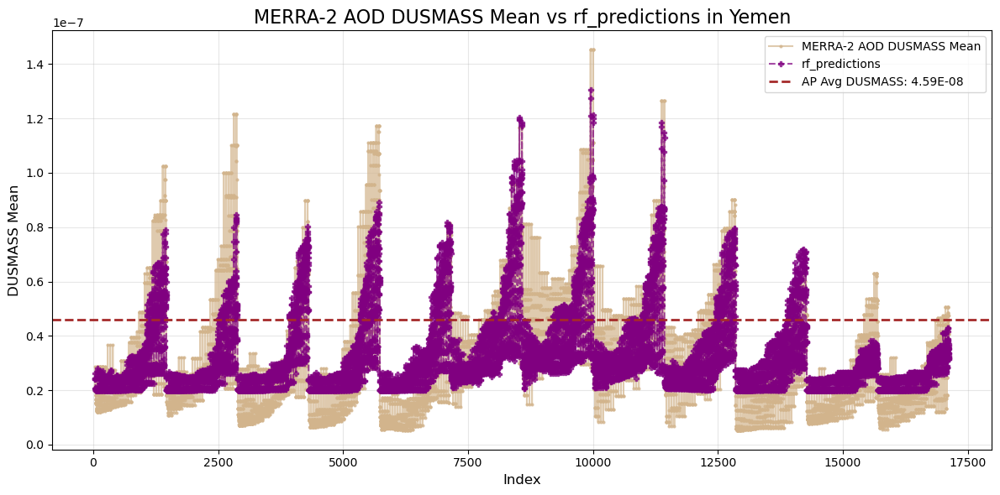

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Kuwait_ensemble_predictions_predictions.png


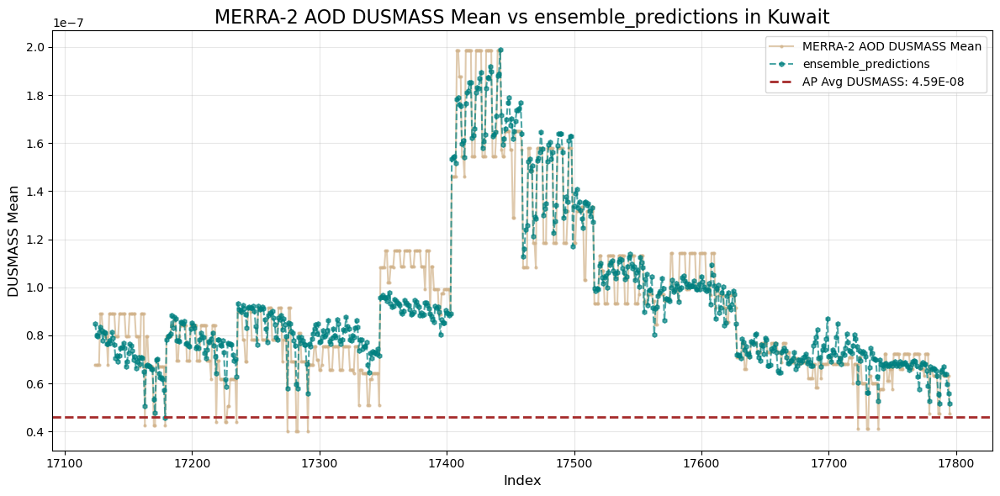

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Kuwait_lr_predictions_predictions.png


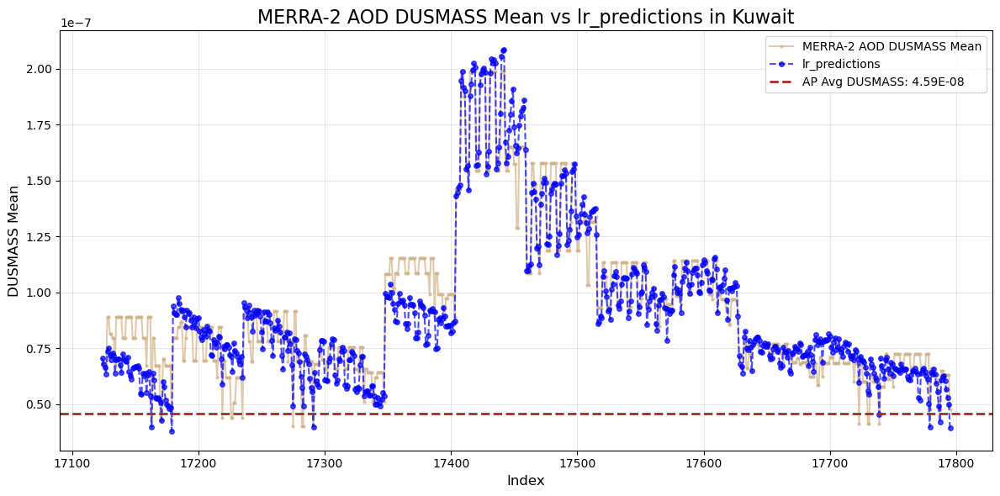

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Kuwait_knn_predictions_predictions.png


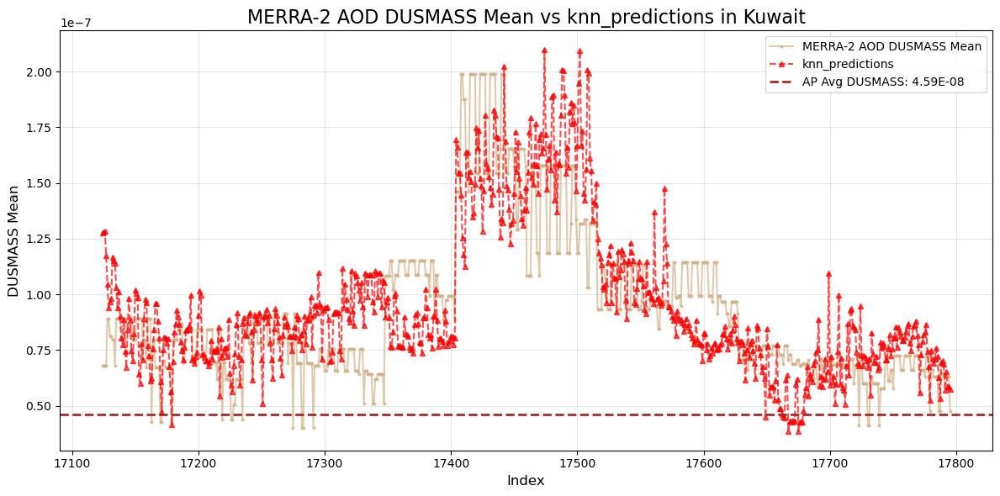

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Kuwait_dt_predictions_predictions.png


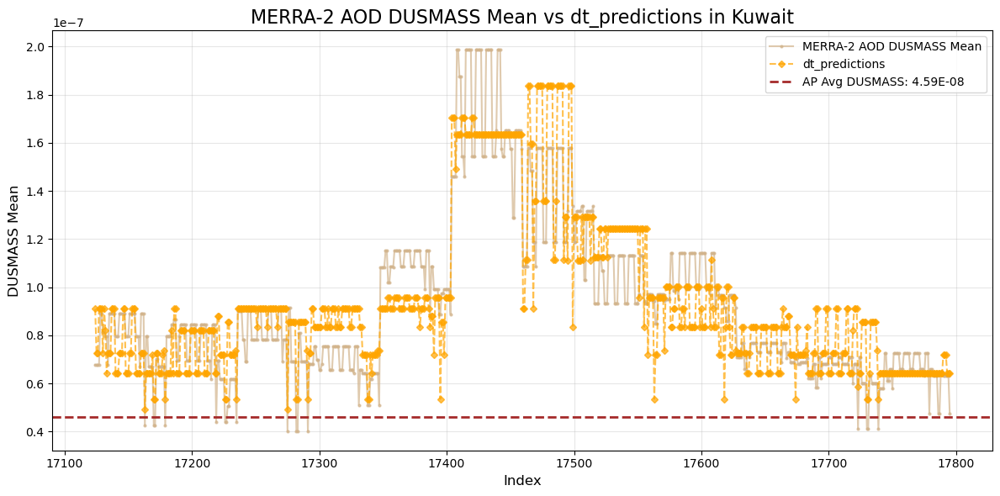

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Kuwait_rf_predictions_predictions.png


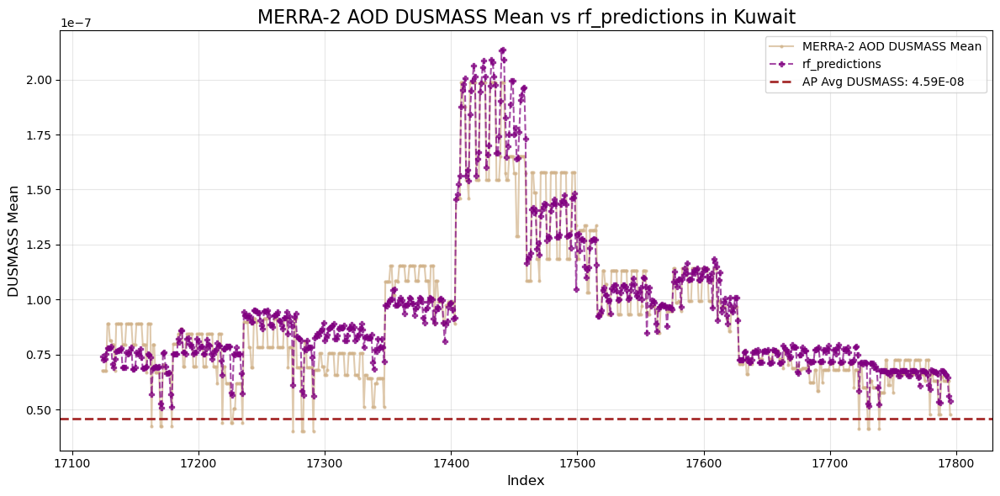

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Oman_ensemble_predictions_predictions.png


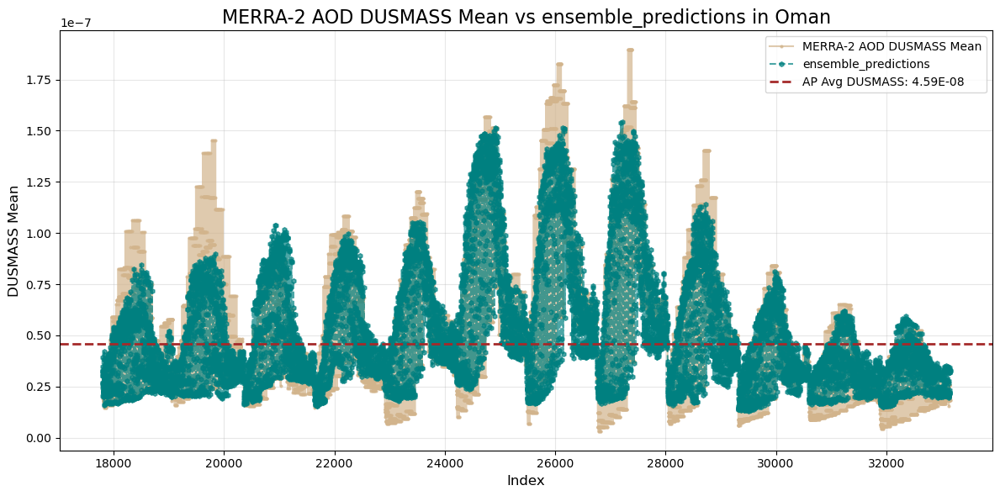

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Oman_lr_predictions_predictions.png


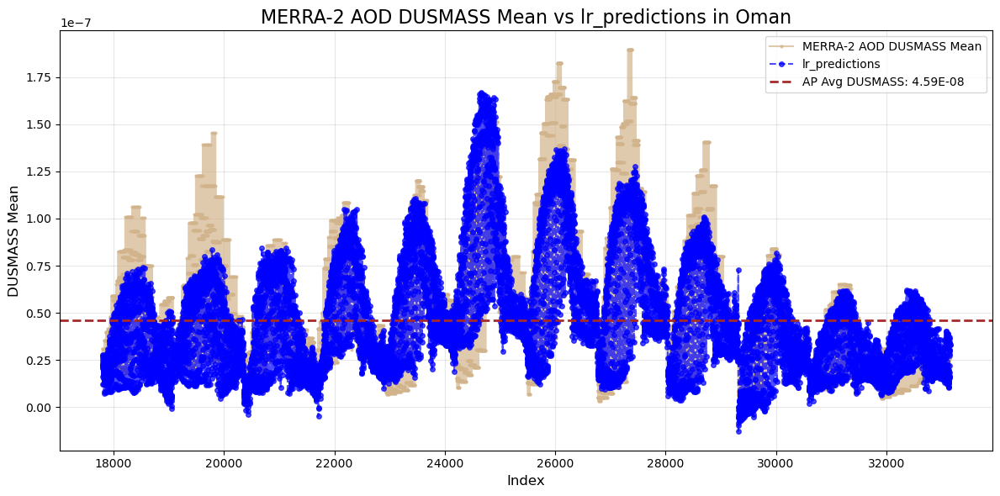

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Oman_knn_predictions_predictions.png


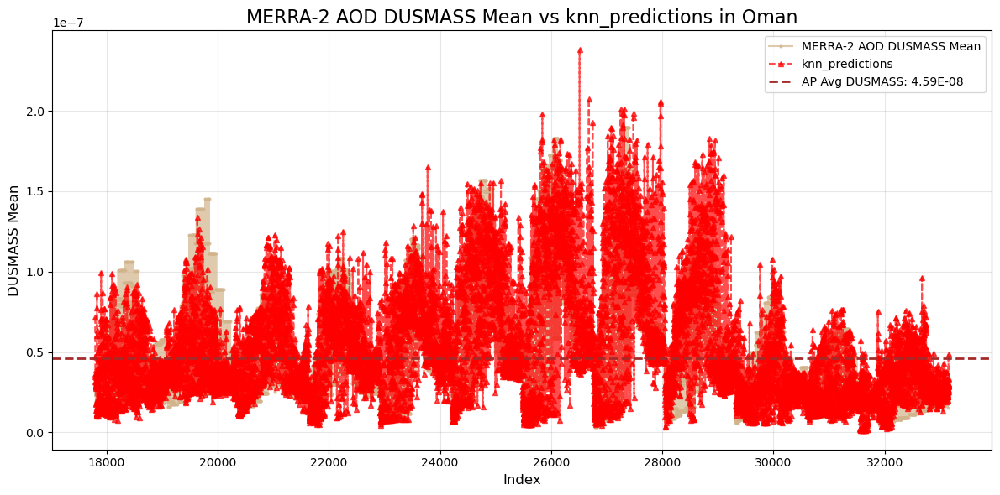

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Oman_dt_predictions_predictions.png


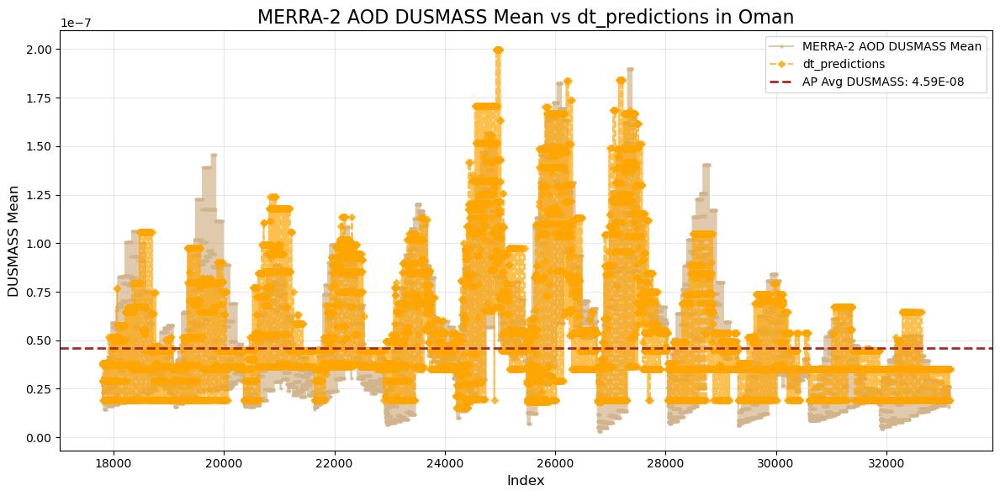

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Oman_rf_predictions_predictions.png


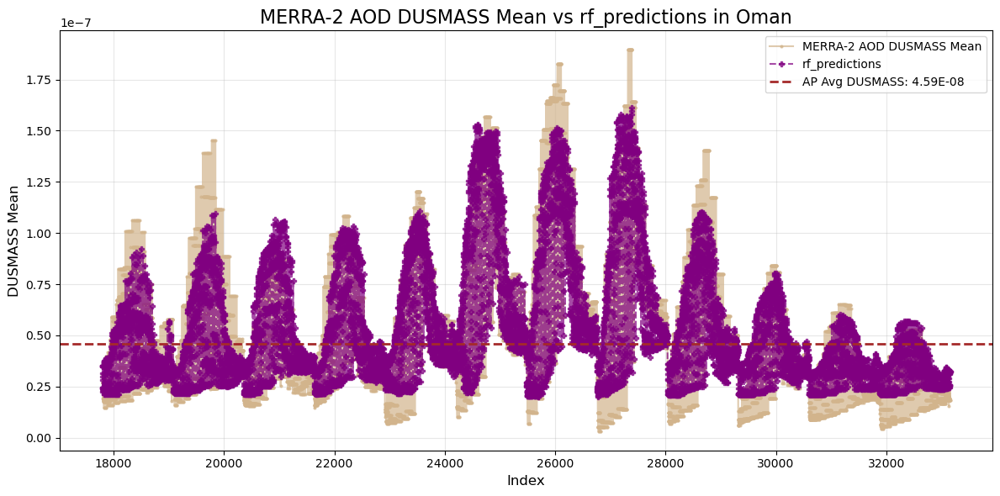

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Qatar_ensemble_predictions_predictions.png


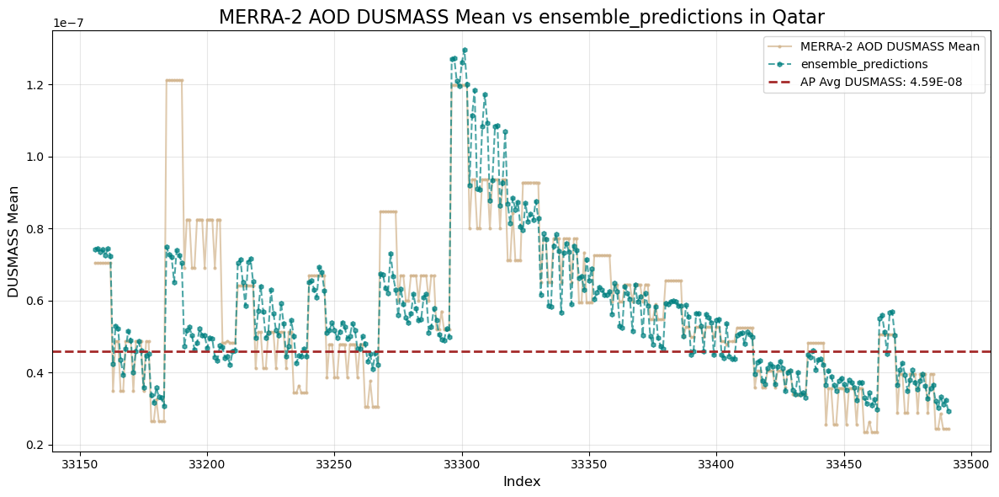

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Qatar_lr_predictions_predictions.png


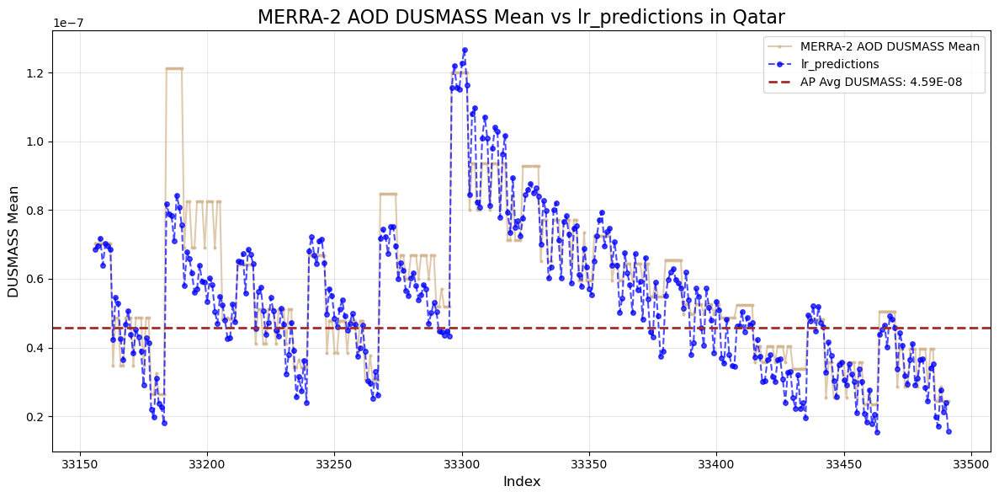

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Qatar_knn_predictions_predictions.png


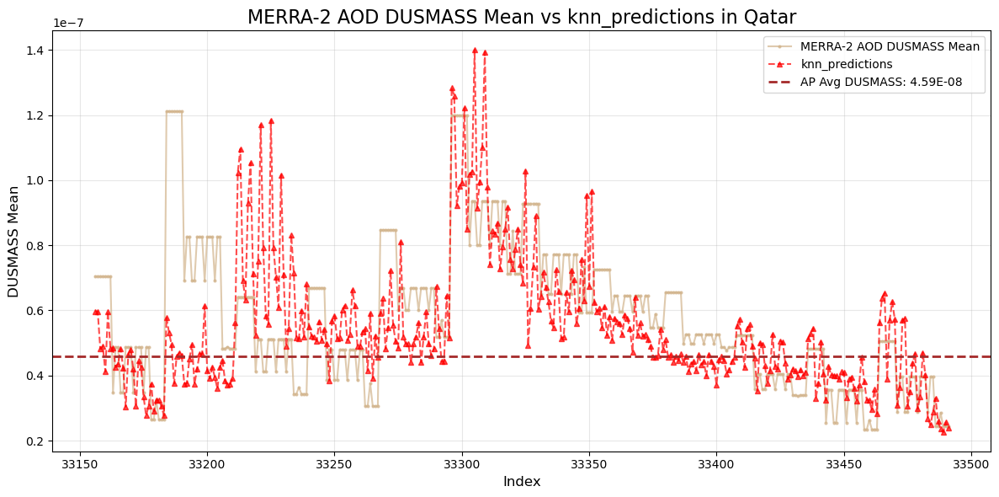

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Qatar_dt_predictions_predictions.png


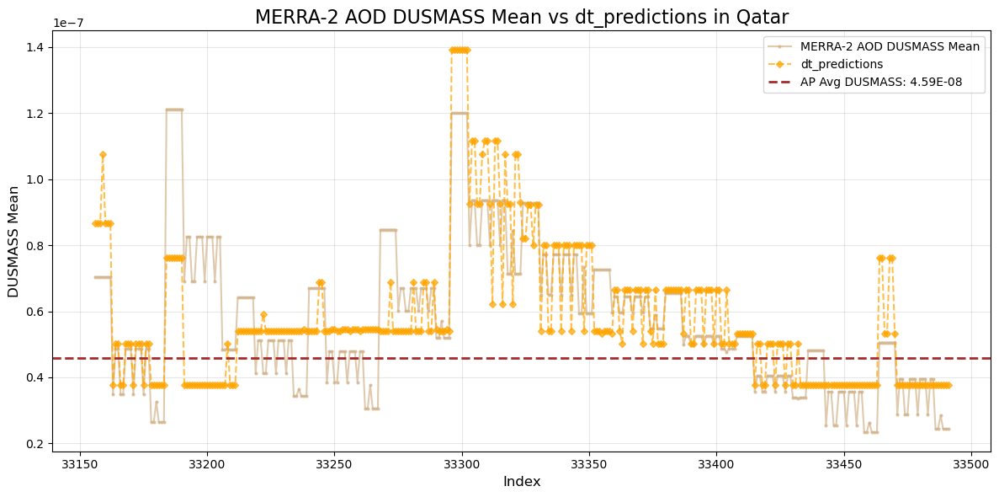

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Qatar_rf_predictions_predictions.png


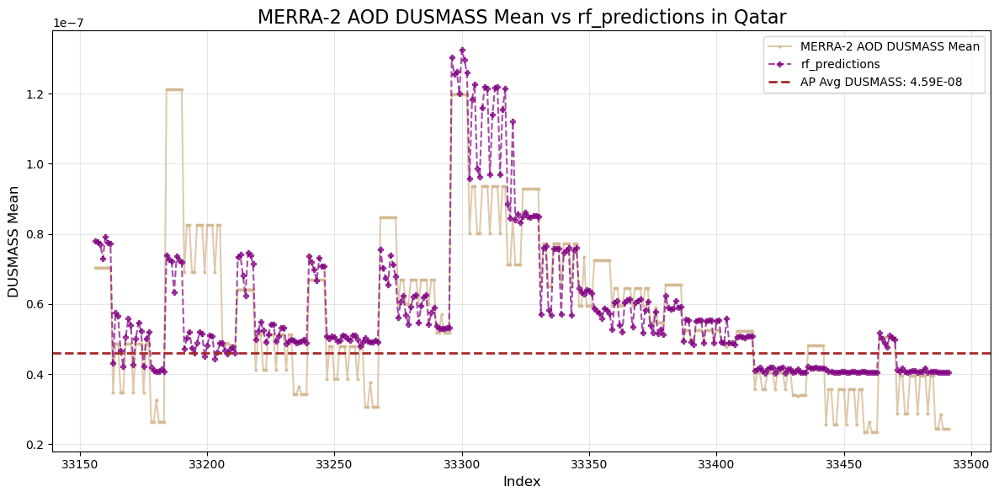

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Saudi_Arabia_ensemble_predictions_predictions.png


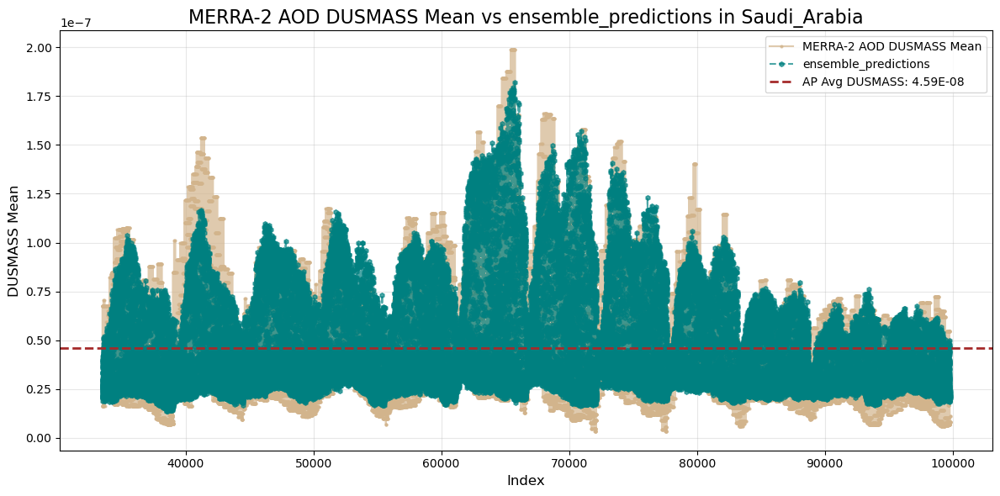

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Saudi_Arabia_lr_predictions_predictions.png


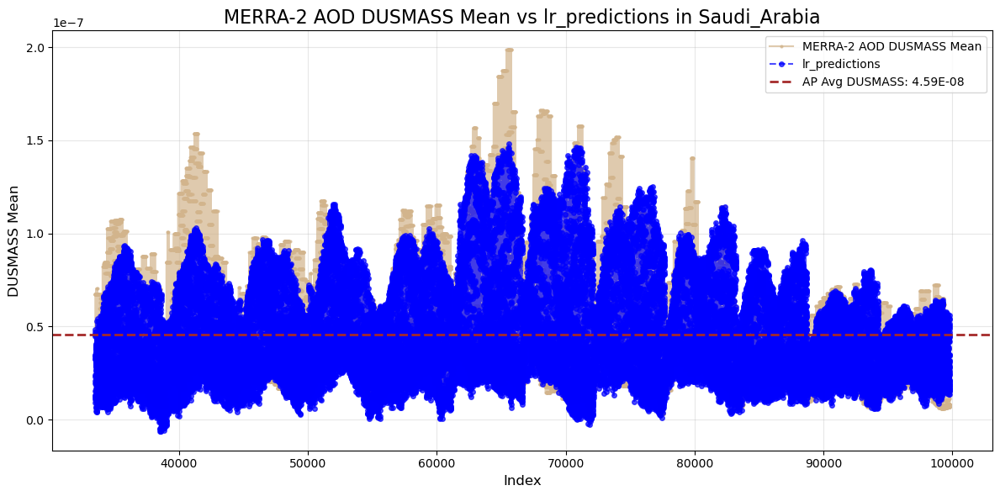

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Saudi_Arabia_knn_predictions_predictions.png


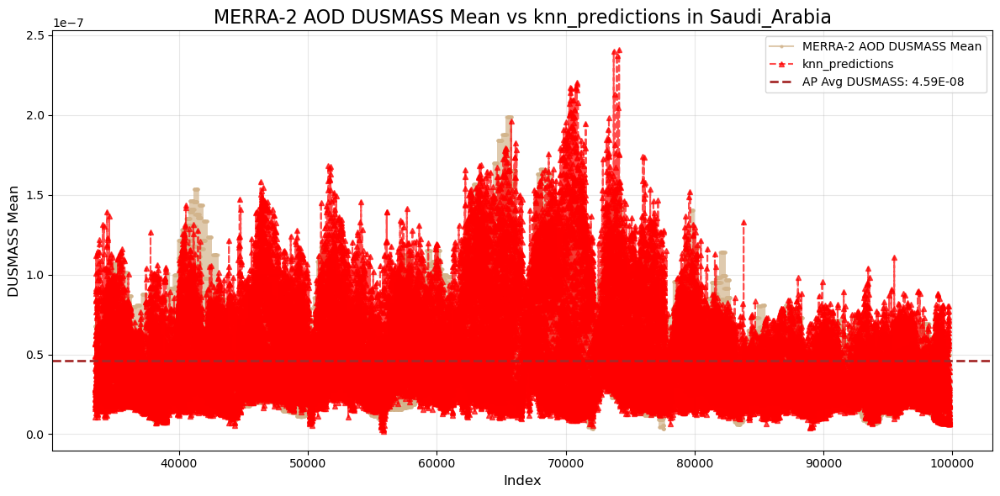

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Saudi_Arabia_dt_predictions_predictions.png


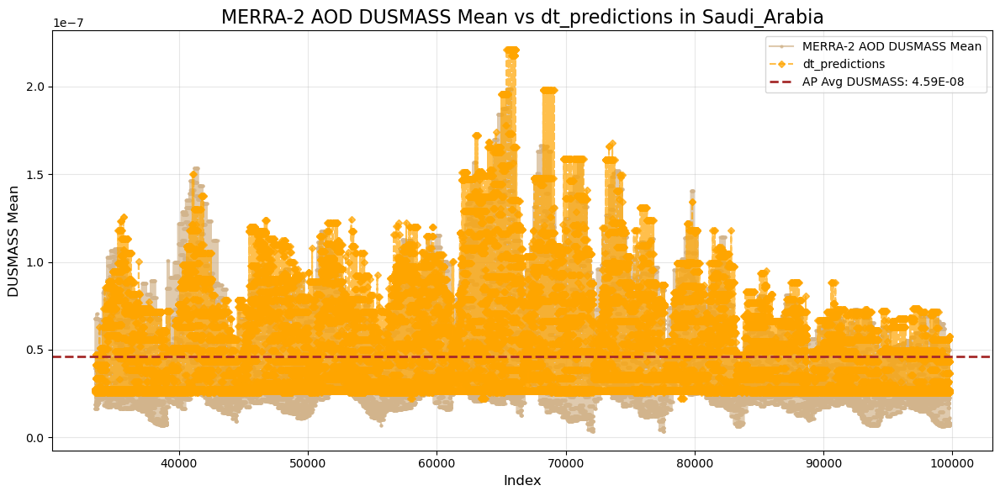

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\Saudi_Arabia_rf_predictions_predictions.png


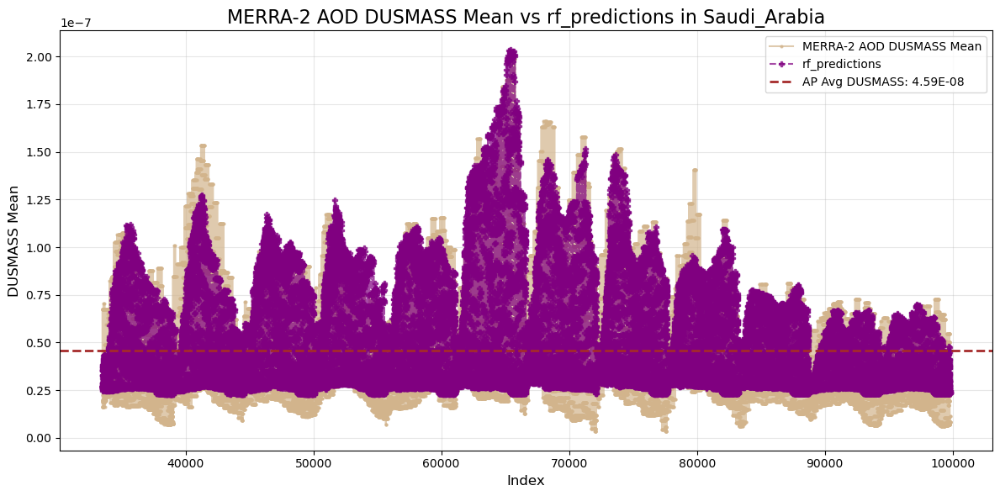

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\United_Arab_Emirates_ensemble_predictions_predictions.png


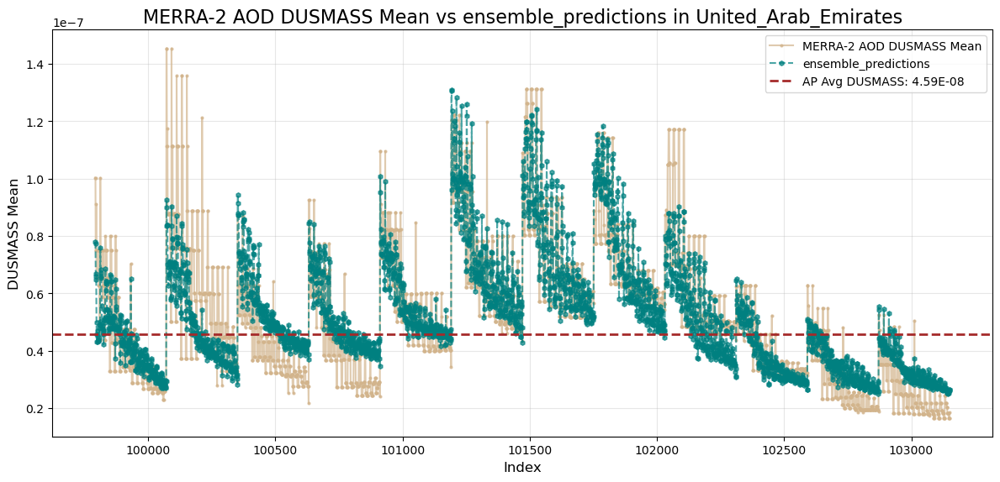

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\United_Arab_Emirates_lr_predictions_predictions.png


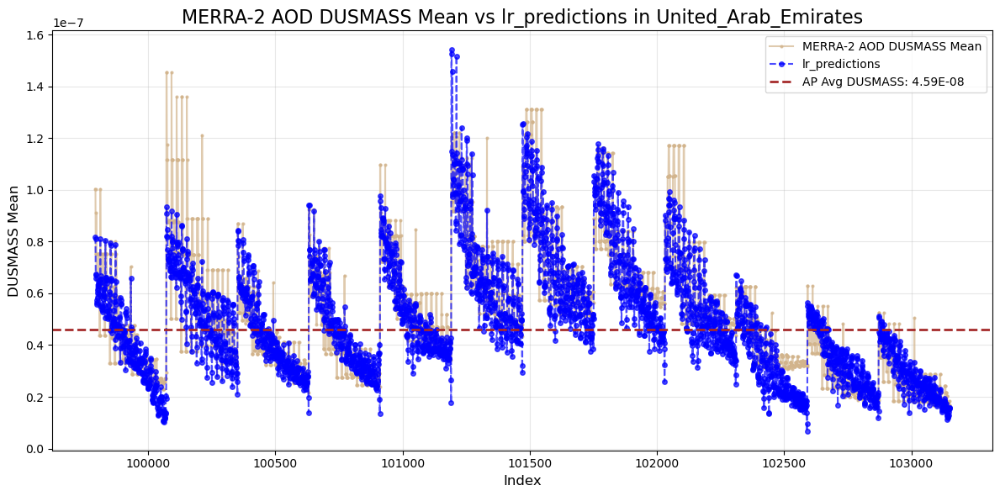

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\United_Arab_Emirates_knn_predictions_predictions.png


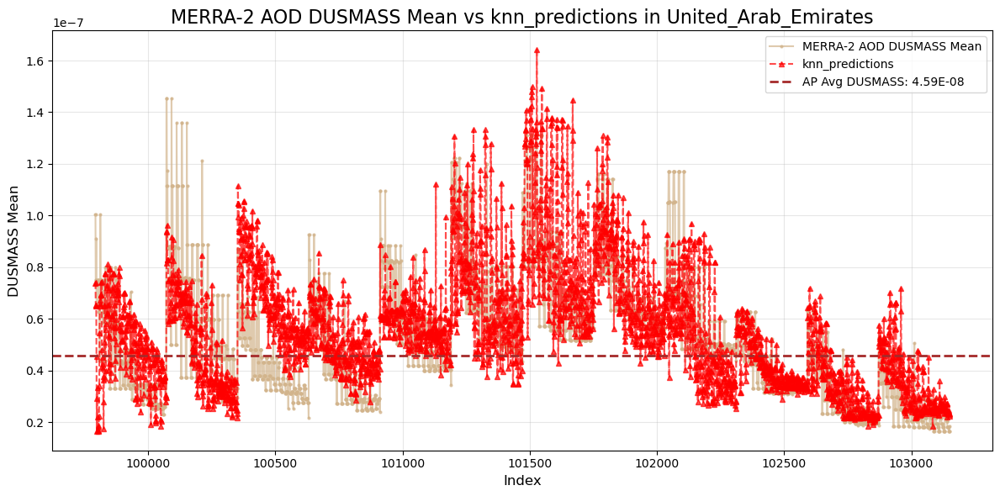

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\United_Arab_Emirates_dt_predictions_predictions.png


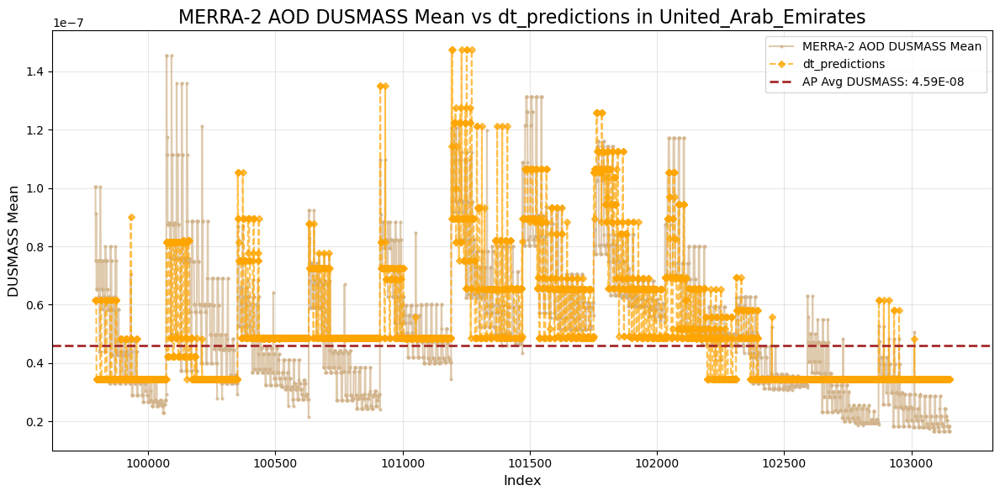

Saved country-model prediction plot: Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots\United_Arab_Emirates_rf_predictions_predictions.png


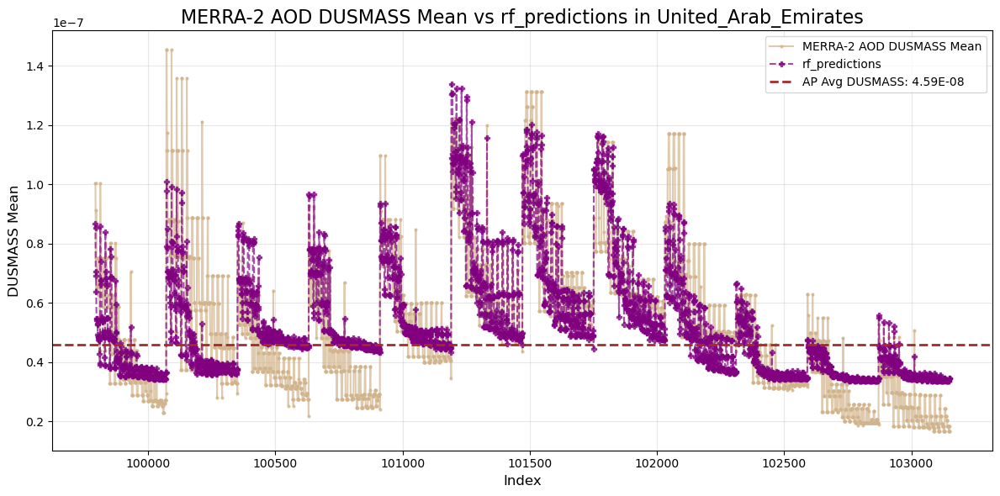

In [18]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define the file path for the dataset
file_path = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\sfc_row_level_predictions_2023_v0063.csv"

# Define output directory for country-model prediction plots
output_dir = r"Z:\Thesis\Data\test\DustCast\SFC\DC_v0063\country_model_prediction_plots"
os.makedirs(output_dir, exist_ok=True)  # Ensure directory exists

# Define model styles
model_styles = {
    'ensemble_predictions': ('teal', 'h'),  # DustCast (DC)
    'lr_predictions': ('blue', 'o'),  # Linear Regression
    #'svr_predictions': ('green', 's'),  # Support Vector Regression
    'knn_predictions': ('red', '^'),  # K-Nearest Neighbors
    'dt_predictions': ('orange', 'D'),  # Decision Tree
    'rf_predictions': ('purple', 'P')  # Random Forest
}

# Define the AP average DUSMASS concentration
average_dusmass = 4.59E-08

# Load the dataset
try:
    dataset = pd.read_csv(file_path)
    
    # Ensure the dataset contains the required columns
    required_columns = {'Country', 'DUSMASS_mean'}
    missing_columns = required_columns - set(dataset.columns)
    if missing_columns:
        raise KeyError(f"The dataset is missing required columns: {missing_columns}")

    # Get unique countries
    countries = dataset['Country'].unique()
    models = model_styles.keys()
    
    # Loop through each country and model to create separate plots
    for country in countries:
        country_data = dataset[dataset['Country'] == country]
        dusmass_mean = country_data['DUSMASS_mean']
        
        for model in models:
            if model in country_data.columns:
                predictions = country_data[model]
                color, marker = model_styles[model]
                
                # Create the plot
                plt.figure(figsize=(12, 6))
                plt.plot(dusmass_mean, linestyle='-', marker='o', markersize=2, color='tan', alpha=0.7, label='MERRA-2 AOD DUSMASS Mean')
                plt.plot(predictions, linestyle='--', marker=marker, markersize=4, color=color, alpha=0.7, label=f'{model}')
                
                # Add horizontal line for AP Avg DUSMASS
                plt.axhline(y=average_dusmass, color='brown', linestyle='--', linewidth=2, label=f'AP Avg DUSMASS: {average_dusmass:.2E}')

                # Add title and labels
                plt.title(f'MERRA-2 AOD DUSMASS Mean vs {model} in {country}', fontsize=16)
                plt.xlabel('Index', fontsize=12)
                plt.ylabel('DUSMASS Mean', fontsize=12)
                
                # Add legend and grid
                plt.legend()
                plt.grid(alpha=0.3)
                plt.tight_layout()
                
                # Save the plot
                save_path = os.path.join(output_dir, f"{country}_{model}_predictions.png")
                plt.savefig(save_path, dpi=300, bbox_inches='tight')
                print(f"Saved country-model prediction plot: {save_path}")

                # Show the plot
                plt.show()

except FileNotFoundError:
    print("The file was not found. Please ensure the file path is correct.")
except KeyError as e:
    print(f"Column not found in the dataset: {e}")
except Exception as e:
    print(f"An error occurred: {e}")
